<table align="center" width=60%>
    <tr>
        <td>
            <div align="center">
                <font color="#7F0542 ">
                    <b><h1>Zee Recommender System</h1>
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

## Data Description:

#### MOVIES FILE DESCRIPTION
================================================================================

Movie information is in the file "movies.dat" and is in the following
format:

MovieID::Title::Genres

- Titles are identical to titles provided by the IMDB (including
year of release)
- Genres are pipe-separated and are selected from the following genres:

	* Action
	* Adventure
	* Animation
	* Children's
	* Comedy
	* Crime
	* Documentary
	* Drama
	* Fantasy
	* Film-Noir
	* Horror
	* Musical
	* Mystery
	* Romance
	* Sci-Fi
	* Thriller
	* War
	* Western

### RATINGS FILE DESCRIPTION
================================================================================

All ratings are contained in the file "ratings.dat" and are in the
following format:

UserID::MovieID::Rating::Timestamp

- UserIDs range between 1 and 6040
- MovieIDs range between 1 and 3952
- Ratings are made on a 5-star scale (whole-star ratings only)
- Timestamp is represented in seconds
- Each user has at least 20 ratings

#### USERS FILE DESCRIPTION
================================================================================

User information is in the file "users.dat" and is in the following
format:

UserID::Gender::Age::Occupation::Zip-code

All demographic information is provided voluntarily by the users and is
not checked for accuracy.  
Only users who have provided some demographic
information are included in this data set.

- Gender is denoted by a "M" for male and "F" for female
- Age is chosen from the following ranges:

	*  1:  "Under 18"
	* 18:  "18-24"
	* 25:  "25-34"
	* 35:  "35-44"
	* 45:  "45-49"
	* 50:  "50-55"
	* 56:  "56+"

- Occupation is chosen from the following choices:

	*  0:  "other" or not specified
	*  1:  "academic/educator"
	*  2:  "artist"
	*  3:  "clerical/admin"
	*  4:  "college/grad student"
	*  5:  "customer service"
	*  6:  "doctor/health care"
	*  7:  "executive/managerial"
	*  8:  "farmer"
	*  9:  "homemaker"
	* 10:  "K-12 student"
	* 11:  "lawyer"
	* 12:  "programmer"
	* 13:  "retired"
	* 14:  "sales/marketing"
	* 15:  "scientist"
	* 16:  "self-employed"
	* 17:  "technician/engineer"
	* 18:  "tradesman/craftsman"
	* 19:  "unemployed"
	* 20:  "writer"

### Our Approach:

In this project, we'll be building a recommender system that is going to recommend movies to a user based on their preferences as well as the choices of other users who are similar to them.

#### **What is a Recommender System?**

A recommender engine, or a recommendation system is a subclass of information filtering system that seeks to predict the "rating" or "preference" a user would give to an item.

#### **Types of Recommender Systems -**

Recommender systems usually make use of either or both *Collaborative Filtering* and *Content-based Filtering* techniques.

#### **Collaberative Filtering**

Collaborative filtering is based on the assumption that people who agreed in the past will agree in the future, and that they will like similar kinds of items as they liked in the past. The system generates recommendations using only information about rating profiles for different users or items. By locating peer users/items with a rating history similar to the current user or item, they generate recommendations using this neighborhood.

#### **Content-based Filtering**

Content-based filtering methods are based on a description of the item and a profile of the user's preferences. These methods are best suited to situations where there is known data on an item (name, location, description, etc.), but not on the user. Content-based recommenders treat recommendation as a user-specific classification problem and learn a classifier for the user's likes and dislikes based on an item's features.

## Table of Contents

1. **[Import Libraries](#import_lib)**
2. **[Set Options](#set_options)**
3. **[Read Data and Data Formatting](#Read_Data)**
    - 3.1 -[Movies](#mov)
    - 3.2 -[Ratings](#rat)
    - 3.3 -[Users](#user)
4. **[Exploratory Data Analysis](#data_preparation)**
    - 4.1 - [Preparing the Dataset](#Data_Preparing)
        - 4.1.1 - [Merging datasets](#merging)
        - 4.1.2 - [Missing Values](#Missing_Values)
        - 4.1.3 - [Feature Engineering](#Feat_eng)
    - 4.2 - [Understanding the Dataset](#Data_Understanding)
        - 4.2.1 - [Analyze Features](#analyze_fea)
5. **[Recommendations systems](#rec_sys)**
    - 5.1 - [Pearson Correlation](#pear)
    - 5.2 - [Cosine Similarty](#cosine)
         - 5.2.1 - [Item-Based Similarity](#itm_sim)
         - 5.2.2 - [User-Based Similarity](#user_sim)
    - 5.3 - [Nearest Neighbors](#nn)
    - 5.4 - [Matrix Factorization](#mf)
        - 5.4.1 - [Using cmfrec library](#cmfrec)
        - 5.4.2 - [Using surprise library](#surp)
    - 5.5 - [User-Based Approach(optional)](#user_based)
    - 5.6 - [Regression-Based System](#reg)
    - 5.7 - [Ensemble Recommender System](#ene)
6. **[Questionnaire](#Quest)**

# 1. Import Libraries <a id='import_lib'></a>

In [1]:
#!pip install cmfrec
#!pip uninstall scikit-surprise numpy
#!pip install numpy==1.23.5
#!pip install scikit-surprise

SEED=95

In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
from cmfrec import CMF
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error

# 2. Set Options <a id='set_options'></a>

In [3]:
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

# 3. Read Data and Data Formatting<a id='Read_Data'></a>

### 3.1 Movies <a id='mov'></a>

In [4]:
movies = pd.read_fwf('movies.dat', encoding='ISO-8859-1')
print(movies.shape)
movies.head()

(3883, 3)


,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [5]:
movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], axis=1, inplace=True)

delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
movies.columns = ['Movie ID', 'Title', 'Genres']

movies.rename(columns={'Movie ID':'MovieID'}, inplace=True)
movies1=movies.copy()
movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


### 3.2 Ratings <a id='rat'></a>

In [6]:
ratings = pd.read_fwf('ratings.dat', encoding='ISO-8859-1')

In [7]:
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp']

print(ratings.shape)
ratings1=ratings.copy()
ratings.head()

(1000209, 4)


,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


### 3.3 Users <a id='user'></a>

In [8]:
users = pd.read_fwf('users.dat', encoding='ISO-8859-1')

In [9]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code']
users1=users.copy()

In [10]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 Above"}}, inplace=True)

In [11]:
users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

In [12]:
print(users.shape)
users.head()

(6040, 5)


,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,k-12 student,48067
1,2,M,56 Above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


# 4. Exploratory Data Analysis <a id='data_preparation'></a>

## 4.1 Preparing the Dataset <a id='Data_Preparing'></a>

In [13]:
# Extract year between parentheses
movies['Year'] = movies['Title'].str.extract(r'\((\d{4})\)', expand=False)

# Remove year (including parentheses and any surrounding whitespace) from Title
movies['Title'] = movies['Title'].str.replace(r'\s*\(\d{4}\)\s*', '', regex=True)

# Strip any remaining whitespace
movies['Title'] = movies['Title'].str.strip()

# Display the result
movies.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,Animation|Children's|Comedy,1995
1,2,Jumanji,Adventure|Children's|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama,1995
4,5,Father of the Bride Part II,Comedy,1995


In [14]:
import pandas as pd

In [15]:
dfmov = movies.copy()
dfmov.dropna(inplace=True)
dfmov.Genres = dfmov.Genres.str.split('|')
dfmov['Genres'] = dfmov['Genres'].apply(lambda x: [i for i in x if i!='A' and i!='D' and i!= 'F' and i!='C' and i!='M' and i!= 'W' and i!= ' '])
for i in dfmov['Genres']:
    for j in range(len(i)):
        if i[j] == 'Ro' or i[j] == 'Rom' or i[j] == 'Roman' or i[j] == 'R' or i[j] == 'Roma':
            i[j] = 'Romance'
        elif i[j] == 'Chil' or i[j] == 'Childre' or i[j] == 'Childr' or i[j] == "Children'" or i[j] =='Children' or i[j] =='Chi':
            i[j] = "Children's"
        elif i[j] == 'Fantas' or i[j] == 'Fant':
            i[j] = 'Fantasy'
        elif i[j] == 'Dr' or i[j] == 'Dram':
            i[j] = 'Drama'
        elif i[j] == 'Documenta'or i[j] == 'Docu' or i[j] == 'Document' or i[j] == 'Documen':
            i[j] = 'Documentary'
        elif i[j] == 'Wester'or i[j] == 'We':
            i[j] = 'Western'
        elif i[j] == 'Animati':
            i[j] = 'Animation'
        elif i[j] == 'Come'or i[j] == 'Comed' or i[j] == 'Com':
            i[j] = 'Comedy'
        elif i[j] == 'Sci-F'or i[j] == 'S' or i[j] == 'Sci-' or i[j] == 'Sci':
            i[j] = 'Sci-Fi'
        elif i[j] == 'Adv'or i[j] == 'Adventu' or i[j] == 'Adventur' or i[j] == 'Advent':
            i[j] = 'Adventure'
        elif i[j] == 'Horro'or i[j] == 'Horr':
            i[j] = 'Horror'
        elif i[j] == 'Th'or i[j] == 'Thri' or i[j] == 'Thrille':
            i[j] = 'Thriller'
        elif i[j] == 'Acti':
            i[j] = 'Action'
        elif i[j] == 'Wa':
            i[j] = 'War'
        elif i[j] == 'Music':
            i[j] = 'Musical'
dfmov.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,"[Animation, Children's, Comedy]",1995
1,2,Jumanji,"[Adventure, Children's, Fantasy]",1995
2,3,Grumpier Old Men,"[Comedy, Romance]",1995
3,4,Waiting to Exhale,"[Comedy, Drama]",1995
4,5,Father of the Bride Part II,[Comedy],1995


### 4.1.1 Merge all above dataframes <a id='merging'></a>

In [16]:
df_1 = pd.merge(dfmov, ratings, how='inner', on='MovieID')
df_1.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474


In [17]:
data = pd.merge(df_1, users, how='inner', on='UserID')
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008,F,50-55,homemaker,55117
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496,M,25-34,programmer,11413
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952,M,25-34,technician/engineer,61614
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474,F,35-44,academic/educator,95370


**Shape of the dataset**

In [18]:
print("No. of rows: ", data.shape[0])
print("No. of columns: ", data.shape[1])

No. of rows:  996144
No. of columns:  11


In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996144 entries, 0 to 996143
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   MovieID     996144 non-null  object
 1   Title       996144 non-null  object
 2   Genres      996144 non-null  object
 3   Year        996144 non-null  object
 4   UserID      996144 non-null  object
 5   Rating      996144 non-null  object
 6   Timestamp   996144 non-null  object
 7   Gender      996144 non-null  object
 8   Age         996144 non-null  object
 9   Occupation  996144 non-null  object
 10  Zip-code    996144 non-null  object
dtypes: object(11)
memory usage: 83.6+ MB


In this dataset we have **11 object columns**

### 4.1.2 Missing Values <a id='Missing_Values'></a>

In [20]:
missing_value = pd.DataFrame({
    'Missing Value': data.isnull().sum(),
    'Percentage': (data.isnull().sum() / len(data))*100
})

In [21]:
missing_value.sort_values(by='Percentage', ascending=False)

,Missing Value,Percentage
MovieID,0,0.00
Title,0,0.00
Genres,0,0.00
Year,0,0.00
UserID,0,0.00
Rating,0,0.00
Timestamp,0,0.00
Gender,0,0.00
Age,0,0.00
Occupation,0,0.00


We have **no missing values** in the dataset

### 4.1.3 Feature Engineering<a id='Feat_eng'></a>

In [22]:
data['Datetime'] = pd.to_datetime(data['Timestamp'], unit='s') #Change the datatype from object to date_time
data['Year']=data['Year'].astype('int32') #Change the datatype from object to Integer
data['Rating']=data['Rating'].astype('int32') #Change the datatype from object to Integer

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996144 entries, 0 to 996143
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   MovieID     996144 non-null  object        
 1   Title       996144 non-null  object        
 2   Genres      996144 non-null  object        
 3   Year        996144 non-null  int32         
 4   UserID      996144 non-null  object        
 5   Rating      996144 non-null  int32         
 6   Timestamp   996144 non-null  object        
 7   Gender      996144 non-null  object        
 8   Age         996144 non-null  object        
 9   Occupation  996144 non-null  object        
 10  Zip-code    996144 non-null  object        
 11  Datetime    996144 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int32(2), object(9)
memory usage: 83.6+ MB


In the data we have **1 datetime, 2 integer and 9 object data type columns**

In [24]:
bins = [1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ['20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
data['ReleaseDec'] = pd.cut(data['Year'], bins=bins, labels=labels)

In [25]:
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseDec
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,90s
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,90s
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,90s
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,90s
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,90s


## 4.2 Understanding the Dataset <a id='Data_Understanding'></a>

### 4.2.1 Analyse Features <a id='analyze_fea'></a>

#### Average User Ratings

In [26]:
user_ratings =data[['UserID','Rating']].groupby('UserID').mean()

Text(0, 0.5, 'Frequency')

<Figure size 800x800 with 0 Axes>

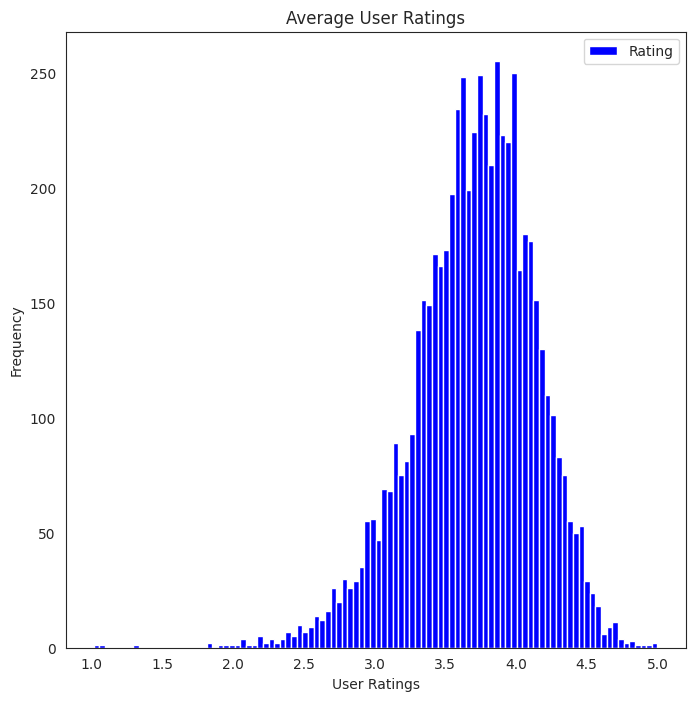

In [27]:
fig = plt.figure(figsize = (8,8))
user_ratings.plot(kind = 'hist', bins = 100, figsize = (8,8), color = 'blue')
plt.plot()
plt.xlabel('User Ratings')
plt.title('Average User Ratings')
plt.ylabel('Frequency')

From above plot, we can see that on average, users are rating movies **3.5-4** more frequently than any other rating.
This makes sense since people are less inclined to rate movies lower than a 3 if they didn't enjoy the movie.

#### No.of movies by Release year.

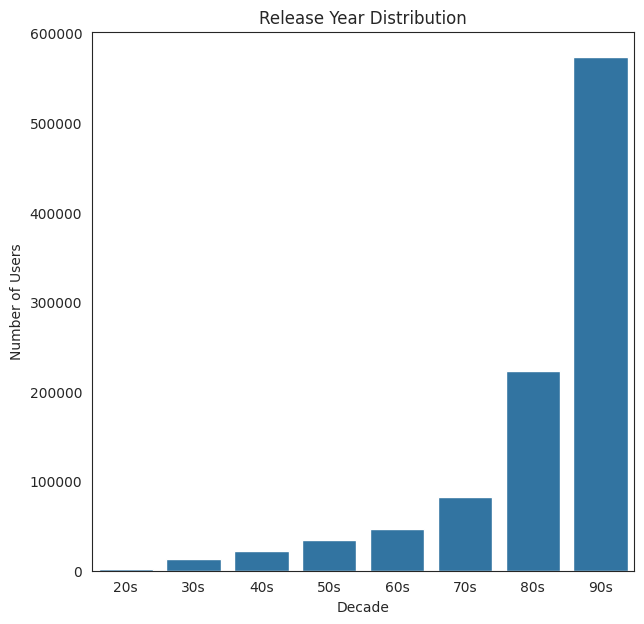

In [28]:
plt.figure(figsize=(7, 7))
sns.countplot(x='ReleaseDec', data=data)
plt.title('Release Year Distribution')
plt.xlabel('Decade')
plt.ylabel('Number of Users')
plt.show()

From the above plot we can infer most of the movies present in the dataset were released in the year **90s**.

In [29]:
l = dfmov.Genres.iloc[:5]

In [30]:
pd.get_dummies(l.apply(pd.Series).stack()).groupby(level=1).sum()

,Adventure,Animation,Children's,Comedy,Drama,Fantasy,Romance
0,1,1,0,3,0,0,0
1,0,0,2,0,1,0,1
2,0,0,0,1,0,1,0


In [31]:
pd.Series(l.iloc[0])

,0
0,Animation
1,Children's
2,Comedy


In [32]:
dfmov.head(2)

,MovieID,Title,Genres,Year
0,1,Toy Story,"[Animation, Children's, Comedy]",1995
1,2,Jumanji,"[Adventure, Children's, Fantasy]",1995


#### Top 10 Genres based on movies count

In [33]:
genres_df = pd.get_dummies(dfmov['Genres'].apply(pd.Series).stack()).groupby(level=0).sum()
genres_df.head()

,,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [34]:
### considering only the genre columns for the test
test = genres_df.iloc[:,0:].sum()
test=test.iloc[1:]
print(test)

Action          501
Adventure       282
Animation       104
Children's      249
Comedy         1189
Crime           210
Documentary     124
Drama          1582
Fantasy          62
Film-Noir        44
Horror          340
Musical         113
Mystery         105
Romance         462
Sci-Fi          265
Thriller        488
War             139
Western          68
dtype: int64


In [35]:
len(test)

18

In [36]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(18,)[0]))
# genre_sum = np.hstack((np.asarray(genre_list).reshape(18,1), test.to_numpy().reshape(18,)))
# genre_sum[:,1] = genre_sum[:,1].astype('int64')
test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


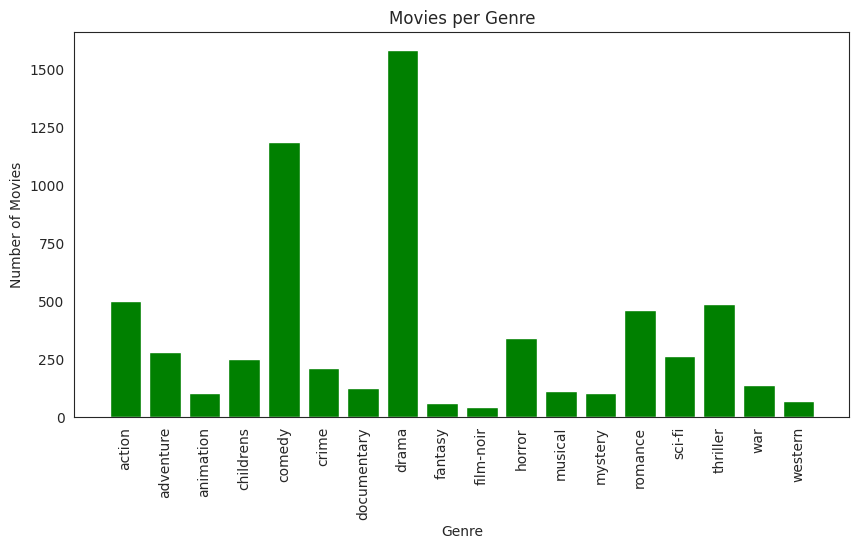

In [37]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime', 'documentary', 'drama','fantasy', 'film-noir', 'horror', 'musical', 'mystery', 'romance', 'sci-fi','thriller', 'war', 'western']
x = np.arange(18)
plt.figure(figsize = (10,5))
plt.bar(x, test2, color = 'g')
plt.xticks(x, genre_list, rotation = 'vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre')
sns.set(font_scale=1.5)
plt.show()

From the above plot we can infer that most the movies in the dataset belongs to **Comedy** and **Drama** genres.

#### **Distribution by Age -**

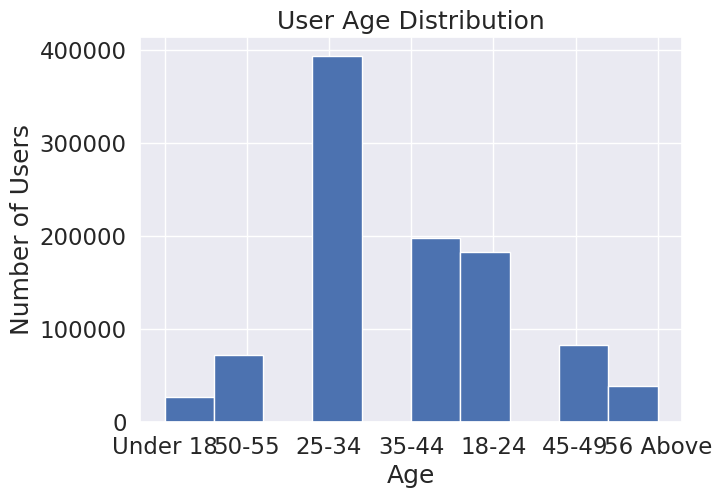

In [38]:
data['Age'].hist(figsize=(7, 5))
plt.title('User Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.show()

From the above plot we can infer that **25-34 age group** have watched and rated the most number of movies

#### **Distribution by Gender -**

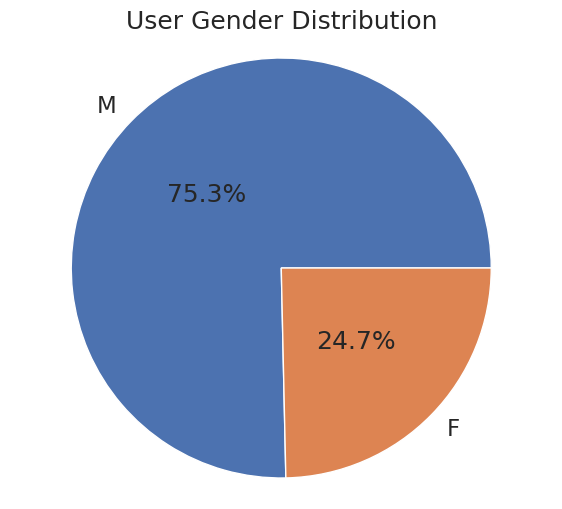

In [39]:
x = data['Gender'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=['M','F'], autopct='%1.1f%%', pctdistance=0.5)
plt.title('User Gender Distribution')
plt.axis('equal')
plt.show()

From the above plot most of the users in our dataset who’ve rated the movies are **Male**.

#### **Distribution by Occupation -**

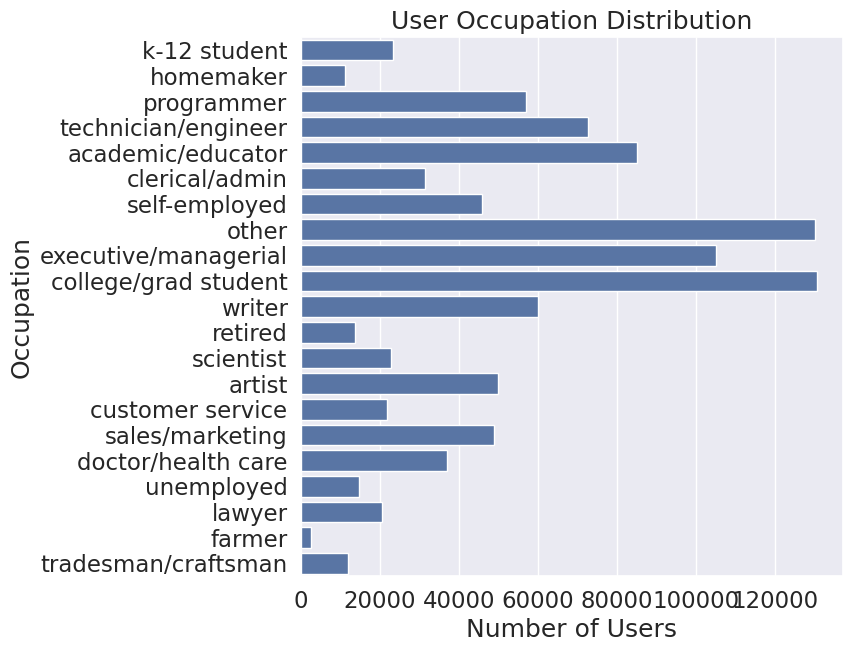

In [40]:
plt.figure(figsize=(7, 7))
sns.countplot(y='Occupation', data=data)
plt.title('User Occupation Distribution')
plt.xlabel('Number of Users')
plt.ylabel('Occupation')
plt.show()

From the above plot users belonging to **college/grad student** profession have watched and rated the most movies.

Text(0, 0.5, 'User Rating count')

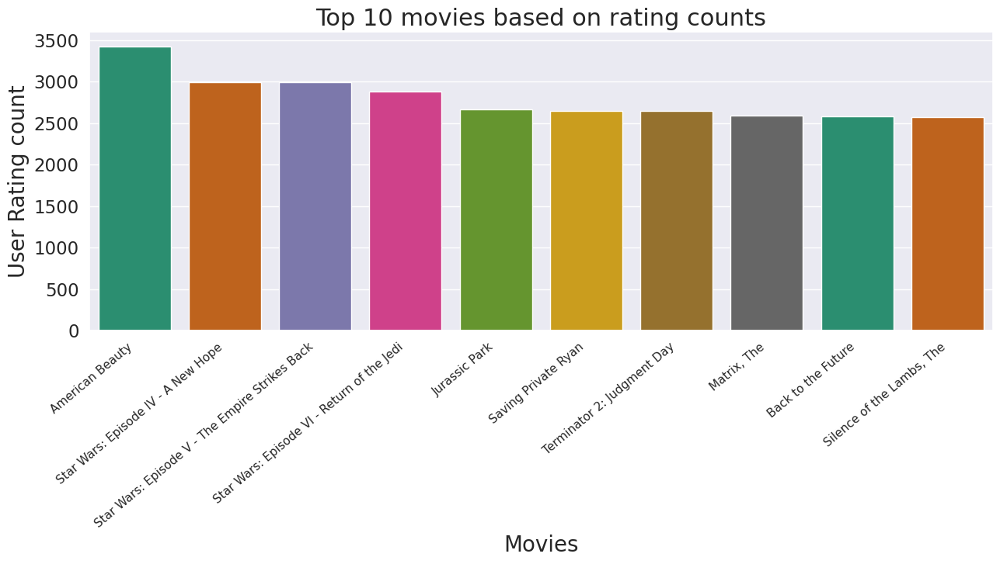

In [41]:
movies_rating_count = data.groupby(by = ['Title'])['Rating'].count().reset_index()[['Title', 'Rating']] ## Counting the ratings based on movies
movies_rating_count.rename(columns = {'Rating': 'totalRatingCount'},inplace=True)

top10_movies=movies_rating_count[['Title', 'totalRatingCount']].sort_values(by = 'totalRatingCount',ascending = False).head(10)

plt.figure(figsize=(15,5))
ax=sns.barplot(x="Title", y="totalRatingCount", data=top10_movies, palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=40, ha="right")
ax.set_title('Top 10 movies based on rating counts',fontsize = 22)
ax.set_xlabel('Movies',fontsize = 20)
ax.set_ylabel('User Rating count', fontsize = 20)

From the above plot, the movie with maximum number of ratings is **American Beauty**.

# 5. Recommendations systems <a id='rec_sys'></a>

#### User-Interaction Matrix

Creating a pivot table of movie titles and userid and ratings are taken as values.

In [42]:
matrix = pd.pivot_table(data, index='UserID', columns='Title', values='Rating', aggfunc='mean')
matrix.fillna(0, inplace=True) # Imputing 'NaN' values with Zero rating

print(matrix.shape)

matrix.head(10)

(6040, 3640)


Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                  0.00           0.00                0.00         0.00   
10                 0.00           0.00                0.00         4.00   
100                0.00           0.00                0.00         0.00   
1000               0.00           0.00                0.00         0.00   
1001               0.00           0.00                0.00         0.00   
1002               0.00           0.00                0.00         0.00   
1003               0.00           0.00                0.00         0.00   
1004               0.00           0.00                0.00         0.00   
1005               0.00           0.00                0.00         0.00   
1006               0.00           0.00                0.00         0.00   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                         0.00   0.00                        0.00   
10                        0.00   0.00                        0.00   
100                       0.00   0.00                        0.00   
1000                      0.00   0.00                        0.00   
1001                      0.00   0.00                        0.00   
1002                      0.00   0.00                        0.00   
1003                      0.00   0.00                        0.00   
1004                      0.00   0.00                        0.00   
1005                      0.00   0.00                        0.00   
1006                      0.00   0.00                        0.00   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                 0.00          0.00               0.00 0.00   
10                0.00          3.00               4.00 0.00   
100               0.00          0.00               0.00 0.00   
1000              4.00          0.00               0.00 0.00   
1001              3.00          0.00               0.00 0.00   
1002              0.00          0.00               0.00 0.00   
1003              0.00          0.00               0.00 0.00   
1004              4.00          0.00               0.00 0.00   
1005              0.00          0.00               0.00 0.00   
1006              0.00          0.00               0.00 0.00   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                       0.00      0.00                          0.00   
10                      0.00      0.00                          4.00   
100                     0.00      0.00                          0.00   
1000                    0.00      0.00                          0.00   
1001                    0.00      0.00                          0.00   
1002                    0.00      0.00                          0.00   
1003                    0.00      0.00                          0.00   
1004                    0.00      0.00                          0.00   
1005                    0.00      0.00                          0.00   
1006                    0.00      0.00                          0.00   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                 0.00                   0.00  0.00                     0.00   
10                0.00                   3.00  0.00                     0.00   
100               0.00                   4.00  0.00                     0.00   
1000              0.00                   0.00  0.00                     0.00   
1001              1.00                   0.00  0.00                     0.00   
1002              0.00                   0.00  0.00                     0.00

In [43]:
# Checking data sparsity
n_users = data['UserID'].nunique()
n_movies = data['MovieID'].nunique()
sparsity = round(1.0 - data.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


## 5.1 Pearson Correlation <a id='pear'></a>

Correlation is a measure that tells how closely two variables move in the same or opposite direction. A positive value indicates that they move in the same direction (i.e. if one increases other increases), where as a negative value indicates the opposite.

The most popular correlation measure for numerical data is Pearson’s Correlation. This measures
the degree of linear relationship between two numeric variables and lies between -1 to +1. It is
represented by ‘r’.

* r=1 means perfect positive correlation
* r=-1 means perfect negative correlation
* r=0 means no linear correlation (note, it does not mean no correlation)


#### Item - Based approach

We will take a movie name as an input from the user and see which other 5 (five) movies have maximum correlation with it.

In [44]:
data[data['Title']=='Home Alone']

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseDec
156020,586,Home Alone,"[Children's, Comedy]",1990,10,3,978228747,F,35-44,academic/educator,95370,2000-12-31 02:12:27,90s
156021,586,Home Alone,"[Children's, Comedy]",1990,11,1,978904356,F,25-34,academic/educator,04093,2001-01-07 21:52:36,90s
156022,586,Home Alone,"[Children's, Comedy]",1990,18,4,978155233,F,18-24,clerical/admin,95825,2000-12-30 05:47:13,90s
156023,586,Home Alone,"[Children's, Comedy]",1990,22,3,978154267,M,18-24,scientist,53706,2000-12-30 05:31:07,90s
156024,586,Home Alone,"[Children's, Comedy]",1990,26,2,978140049,M,25-34,executive/managerial,23112,2000-12-30 01:34:09,90s
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156690,586,Home Alone,"[Children's, Comedy]",1990,5991,3,1000092830,F,35-44,writer,94025,2001-09-10 03:33:50,90s
156691,586,Home Alone,"[Children's, Comedy]",1990,5996,3,966275845,F,25-34,other,87114,2000-08-14 17:57:25,90s
156692,586,Home Alone,"[Children's, Comedy]",1990,6000,3,956884722,M,45-49,technician/engineer,30075,2000-04-28 01:18:42,90s
156693,586,Home Alone,"[Children's, Comedy]",1990,6006,2,957033431,F,Under 18,other,01036,2000-04-29 18:37:11,90s


In [45]:
#movie_name = input("Enter a movie name: ")
movie_name='Home Alone'
movie_rating = matrix[movie_name] # Taking the ratings of that movie
print(movie_rating)

UserID
1      0.00
10     3.00
100    0.00
1000   0.00
1001   0.00
       ... 
995    0.00
996    0.00
997    0.00
998    0.00
999    0.00
Name: Home Alone, Length: 6040, dtype: float64


In [46]:
similar_movies = matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
Title,
Home Alone 2: Lost in New York,0.55
Mrs. Doubtfire,0.47
Liar Liar,0.46
"Mighty Ducks, The",0.45
Sister Act,0.44


## 5.2 Cosine Similarty <a id='cosine'></a>

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them, i.e. the dot product of the vectors divided by the product of their lengths.

The cosine similarity always belongs to the interval [-1,1]. For example, two proportional vectors have a cosine similarity of 1, two orthogonal vectors have a similarity of 0, and two opposite vectors have a similarity of -1.

In [47]:
item_sim = cosine_similarity(matrix.T) #Finding the similarity values between item-item using cosine_similarity
item_sim

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

In [48]:
item_sim.shape

(3640, 3640)

### 5.2.1 Item-Based Similarity<a id='itm_sim'></a>

In [49]:
item_sim_matrix = pd.DataFrame(item_sim, index=matrix.columns, columns=matrix.columns)
item_sim_matrix.head() #Item-similarity Matrix

Title                   $1,000,000 Duck  'Night Mother  'Til There Was You  \
Title                                                                        
$1,000,000 Duck                    1.00           0.07                0.04   
'Night Mother                      0.07           1.00                0.12   
'Til There Was You                 0.04           0.12                1.00   
'burbs, The                        0.08           0.12                0.10   
...And Justice for All             0.06           0.16                0.07   

Title                   'burbs, The  ...And Justice for All  1-900  \
Title                                                                
$1,000,000 Duck                0.08                    0.06   0.00   
'Night Mother                  0.12                    0.16   0.00   
'Til There Was You             0.10                    0.07   0.08   
'burbs, The                    1.00                    0.14   0.00   
...And Justice for All         0.14                    1.00   0.00   

Title                   10 Things I Hate About You  101 Dalmatians  \
Title                                                                
$1,000,000 Duck                               0.06            0.19   
'Night Mother                                 0.08            0.14   
'Til There Was You                            0.13            0.13   
'burbs, The                                   0.19            0.25   
...And Justice for All                        0.08            0.18   

Title                   12 Angry Men  13th Warrior, The  187  \
Title                                                          
$1,000,000 Duck                 0.09               0.06 0.03   
'Night Mother                   0.11               0.05 0.06   
'Til There Was You              0.08               0.07 0.02   
'burbs, The                     0.17               0.20 0.10   
...And Justice for All          0.21               0.12 0.11   

Title                   2 Days in the Valley  20 Dates  \
Title                                                    
$1,000,000 Duck                         0.02      0.02   
'Night Mother                           0.11      0.04   
'Til There Was You                      0.07      0.09   
'burbs, The                             0.18      0.05   
...And Justice for All                  0.20      0.04   

Title                   20,000 Leagues Under the Sea  200 Cigarettes  \
Title                                                                  
$1,000,000 Duck                                 0.14            0.09   
'Night Mother                                   0.07            0.14   
'Til There Was You                              0.03            0.20   
'burbs, The                                     0.19            0.24   
...And Justice for All                          0.17            0.11   

Title                   2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
Title                                                                          
$1,000,000 Duck                          0.07  0.04                     0.00   
'Night Mother                            0.10  0.08                     0.06   
'Til There Was You                       0.06  0.04                     0.00   
'burbs, The                              0.20  0.19                     0.00   
...And Justice for All                   0.22  0.15                     0.08   

Title                   24-hour Woman  28 Days  \
Title                                            
$1,000,000 Duck                  0.00     0.06   
'Night Mother                    0.06     0.06   
'Til There Was You               0.17     0.12   
'burbs, The                      0.04     0.12   
...And Justice for All           0.02     0.09   

Title                   3 Ninjas: High Noon On Mega Mountain  3 Strikes  \
Title                                                                     
$1,000,000 Duck                                 

### 5.2.2 User-Based Similarity<a id='user_sim'></a>

In [50]:
user_sim = cosine_similarity(matrix) #Finding the similarity values between user-user using cosine_similarity
user_sim

array([[1.        , 0.25531859, 0.12396703, ..., 0.15926709, 0.11935626,
        0.12239079],
       [0.25531859, 1.        , 0.25964457, ..., 0.16569953, 0.13332665,
        0.24845029],
       [0.12396703, 0.25964457, 1.        , ..., 0.20430203, 0.11352239,
        0.30693676],
       ...,
       [0.15926709, 0.16569953, 0.20430203, ..., 1.        , 0.18657496,
        0.18563871],
       [0.11935626, 0.13332665, 0.11352239, ..., 0.18657496, 1.        ,
        0.10827118],
       [0.12239079, 0.24845029, 0.30693676, ..., 0.18563871, 0.10827118,
        1.        ]])

In [51]:
user_sim_matrix = pd.DataFrame(user_sim, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()

UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.26 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.26 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.31  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.31  1.00  0.10  0.05  0.20  0.36  0.33  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.10  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.15  0.18  0.11   
10      0.12 0.21  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.29  0.24  0.33   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.30  0.20  0.17  0.15  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.12  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.16 0.22   
1000   0.10  0.14  0.17  0.06  0.05  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.18  0.15  0.10  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.16 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.13  0.17  0.05  0.18  0.06 0.09  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.15  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.05  0.08  0.08  0.15  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.07  0.25  0.10  0.23  0.10  0.13  0.26  0.10  0.11 0.16  0.28  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.14  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.23  0.20  0.14  0.30  0.34  0.34 0.17  0.11  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.26  0.32  0.21 0.09  0.11  0.05  0.08   
1000    0.02  0.33  0.15  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.15  0.13  0.17  0.04  0.17  0.25  0.25 0.07  0.13  0.08  0.12   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.19  0.39  0.12 0.19  0.02  0.19  0.24  0.17   
100     0.26  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.19  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.17  0.23  0.29 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

## 5.3 Nearest Neighbors <a id='nn'></a>

In [52]:
model_knn = NearestNeighbors(metric='cosine')
model_knn.fit(matrix.T)

NearestNeighbors(metric='cosine')

In [53]:
##The distances and indices are being calculated with neighbors being 6
distances, indices = model_knn.kneighbors(matrix.T, n_neighbors= 6)

In [54]:
result = pd.DataFrame(indices, columns=['Title1', 'Title2', 'Title3', 'Title4', 'Title5','Title6'])
result.head()
#The result dataframe consits of the different indices of movies based on the distance

,Title1,Title2,Title3,Title4,Title5,Title6
0,0,735,416,286,584,3247
1,1,807,72,2167,3036,3369
2,2,1627,2529,3320,2588,1999
3,3,1457,2169,1308,1047,3511
4,4,26,726,894,495,944


In [55]:
##With this for loop replacing the indices in the result dataframe with movie titles of that corresponding ones
result2 = result.copy()
for i in range(1, 7):
    mov = pd.DataFrame(matrix.T.index).reset_index()
    mov = mov.rename(columns={'index':f'Title{i}'})
    result2 = pd.merge(result2, mov, on=[f'Title{i}'], how='left')
    result2 = result2.drop(f'Title{i}', axis=1)
    result2 = result2.rename(columns={'Title':f'Title{i}'})
result2.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,"$1,000,000 Duck","Computer Wore Tennis Shoes, The",Blackbeard's Ghost,"Barefoot Executive, The",Candleshoe,That Darn Cat!
1,'Night Mother,"Cry in the Dark, A",Agnes of God,Mommie Dearest,Sophie's Choice,"Trip to Bountiful, The"
2,'Til There Was You,If Lucy Fell,Picture Perfect,To Gillian on Her 37th Birthday,Practical Magic,Mad Love
3,"'burbs, The",Harry and the Hendersons,"Money Pit, The",Ghostbusters II,European Vacation,Weekend at Bernie's
4,...And Justice for All,52 Pick-Up,Coma,Deliverance,"Boys from Brazil, The",Dog Day Afternoon


In [56]:
#movie_name = input("Enter a movie name: ")
movie_name = 'Liar Liar'
result2.loc[result2['Title1']==movie_name] #5 nearest movies for the movie present in Title1.

,Title1,Title2,Title3,Title4,Title5,Title6
1887,Liar Liar,Mrs. Doubtfire,Ace Ventura: Pet Detective,Dumb & Dumber,Home Alone,Wayne's World


## 5.4 Matrix Factorization <a id='mf'></a>

Creating a pivot table of movie titles and userid and ratings are taken as values.

In [57]:
rm = data.pivot(index = 'UserID', columns ='MovieID', values = 'Rating').fillna(0)
rm.head()

MovieID    1   10  100  1000  1002  1003  1004  1005  1006  1007  1008  1009  \
UserID                                                                         
1       5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
10      5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  5.00   
100     0.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1000    5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1001    4.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

MovieID  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  \
UserID                                                                          
1       0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
10      0.00  0.00  0.00  3.00  0.00  0.00  3.00  5.00  0.00  0.00  4.00 0.00   
100     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1001    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                     
1        0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  5.00  5.00 0.00   
10       3.00  0.00  5.00  5.00  0.00  4.00  0.00  0.00  5.00  0.00 0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  3.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 0.00   
10       3.00  4.00  4.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 3.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  4.00  0.00  0.00  0.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1040  1041  1042  1043  1044  1046  1047  1049  105  1050  1051  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
10       0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   

MovieID  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00  5.00 0.00  0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00  0.00   

MovieID  1063  1064  1066  1067  1068  1069  107  1070  1071  1073  1076  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  5.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1001     2.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   

MovieID  1077  1078  1079  108  1080  1081  1082  1083  1084  1085  1086  \
UserID                                                                     
1        0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00

### 5.4.1 Using Cmfrec Library<a id='cmfrec'></a>

In [58]:
user_itm = data[['UserID', 'MovieID', 'Rating']].copy()
user_itm.columns = ['UserId', 'ItemId', 'Rating']  # Lib requires specific column names
user_itm.head(2)

,UserId,ItemId,Rating
0,1,1,5
1,6,1,4


In [59]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserId'].unique()))
print("No.of Items:",len(user_itm['ItemId'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3682


In [60]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model.fit(user_itm) #Fitting the model

Collective matrix factorization model
(explicit-feedback variant)


In [61]:
model.A_.shape, model.B_.shape #model.A_ gives the embeddings of Users and model.B_ gives the embeddings of Items.

((6040, 4), (3682, 4))

In [62]:
user_itm.Rating.mean(), model.glob_mean_  # Average rating and Global Mean

(3.57998542379415, 3.5799853801727295)

In [63]:
rm__ = np.dot(model.A_, model.B_.T) + model.glob_mean_  # Calculating the predicted ratings
rmse = np.sqrt(mean_squared_error(rm.values[rm > 0], rm__[rm > 0]))  # Calculating RMSE
print('Root Mean Squared Error: {:.3f}'.format(rmse))
mape = mean_absolute_percentage_error(rm.values[rm > 0], rm__[rm > 0])  # Calculating MAPE
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Root Mean Squared Error: 1.468
Mean Absolute Percentage Error: 0.421


**Embeddings for user-user similarity.**

In [64]:
user=cosine_similarity(model.A_)

user_sim_matrix = pd.DataFrame(user, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()  #User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00 -0.09  0.36 -0.25  0.72  0.33 -0.01 -0.63 -0.45 -0.57 -0.46   
10     -0.09  1.00 -0.51  0.06  0.58  0.33  0.15 -0.57  0.04  0.78  0.29   
100     0.36 -0.51  1.00  0.66 -0.07  0.49  0.66  0.44  0.45 -0.26  0.13   
1000   -0.25  0.06  0.66  1.00 -0.20  0.54  0.92  0.58  0.89  0.53  0.57   
1001    0.72  0.58 -0.07 -0.20  1.00  0.60 -0.02 -0.88 -0.45  0.05 -0.00   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.42  0.84 -0.03  0.05 -0.49 -0.46  0.10  0.76  0.13 -0.13  0.62   
10      0.37 -0.24  0.83  0.90  0.84  0.54  0.11  0.45  0.50  0.96  0.64   
100     0.59  0.77 -0.01 -0.19 -0.33  0.17  0.43  0.32  0.24 -0.31  0.10   
1000    0.69  0.24  0.51  0.27  0.42  0.84  0.47  0.17  0.47  0.32  0.14   
1001    0.50  0.53  0.56  0.69  0.21 -0.01  0.34  0.91  0.58  0.49  0.84   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.32  0.08  0.60  0.54 -0.34  0.31 -0.16 -0.48 -0.45 -0.45  0.82   
10     -0.19 -0.40  0.12 -0.34  0.02  0.57 -0.31  0.78  0.79  0.27 -0.41   
100     0.14  0.90  0.14  0.93  0.28  0.41  0.81 -0.16 -0.19  0.32  0.70   
1000    0.19  0.76 -0.08  0.55  0.50  0.66  0.91  0.60  0.54  0.87  0.10   
1001   -0.14 -0.13  0.35  0.25 -0.06  0.58 -0.41  0.12  0.21 -0.30  0.27   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1       0.14 -0.27 -0.12 -0.03 -0.04  0.67 -0.18 -0.68  0.51 -0.08 -0.70   
10     -0.30  0.37  0.02  0.75  0.65 -0.64  0.46  0.02  0.19  0.62 -0.27   
100     0.44 -0.02  0.73  0.16 -0.10  0.74  0.42  0.15  0.72 -0.03 -0.07   
1000    0.19  0.31  0.99  0.68  0.36  0.03  0.91  0.59  0.67  0.36  0.15   
1001    0.13  0.24 -0.14  0.44  0.20  0.20  0.14 -0.39  0.52  0.50 -0.56   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1       0.21 -0.66 -0.08 -0.16  0.32  0.47  0.47  0.23  0.00  0.78  0.05   
10     -0.20  0.24  0.45  0.51  0.84 -0.12  0.32 -0.35 -0.58  0.48 -0.18   
100     0.93  0.02  0.33  0.35 -0.05  0.71  0.34  0.93  0.87 -0.02  0.72   
1000    0.86  0.55  0.69  0.86  0.28  0.44  0.27  0.74  0.72 -0.24  0.68   
1001    0.02 -0.22  0.35  0.12  0.73  0.43  0.74  0.01 -0.48  0.99  0.05   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1       0.78 -0.73  0.04  0.00 -0.27  0.09 -0.05 -0.04  0.17  0.78  0.52   
10      0.01  0.26 -0.26  0.49  0.06 -0.10 -0.51  0.28  0.52 -0.46 -0.54   
100     0.73  0.12  0.86  0.33  0.41  0.42  0.91  0.59  0.09  0.86  0.63   
1000    0.40  0.79  0.89  0.74  0.65  0.31  0.82  0.93  0.27  0.27  0.04   
1001    0.58 -0.47 -0.24  0.17 -0.00  0.22 -0.41  0.06  0.65  0.28  0.21   

UserID  1058  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  \
UserID                                                                          
1      -0.27 -0.12 0.63  0.56  0.44 -0.09 -0.00  0.44 -0.33  0.73  0.31 -0.17   
10     -0.02  0.13 0.31 -0.40  0.09  0.50  0.68  0.81 -0.19  0.52 -0.15  0.38   
100     0.68  0.68 0.22  0.70  0.80  0.38  0.19 -0.31  0.62  0.10  0.54  0.29   
1000    0.97  0.97 0.11  0.20  0.74  0.85  0.68 -0.13  0.81  0.01  0.30  0.75   
1001   -0.21  0.00 0.53  0.33  0.40  0.17  0.35  0.79 -0.28  0.82  0.35 -0.05   

UserID  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  \
UserID                                                                     
1      -0.50 -0.48  0.85  0.68 -0.39 -0.31 -0.16 -0.12 -0.34  0.74  0.90   
10    

In [65]:
itm=cosine_similarity(model.B_)

itm_sim_matrix = pd.DataFrame(itm, index=user_itm['ItemId'].unique(), columns=user_itm['ItemId'].unique())
itm_sim_matrix.head()#Item similarity matrix using the embeddings from matrix factorization

1    2     3     4    5     6    7    8     9   10   11    12   13   14  \
1  1.00 0.26 -0.06 -0.14 0.04  0.68 0.30 0.07 -0.30 0.50 0.81 -0.53 0.33 0.32   
2  0.26 1.00  0.93  0.82 0.95  0.15 0.95 0.95  0.78 0.77 0.72  0.66 0.92 0.42   
3 -0.06 0.93  1.00  0.78 0.97 -0.00 0.89 0.89  0.94 0.73 0.51  0.81 0.74 0.14   
4 -0.14 0.82  0.78  1.00 0.84 -0.28 0.73 0.95  0.71 0.29 0.27  0.88 0.89 0.62   
5  0.04 0.95  0.97  0.84 1.00 -0.11 0.96 0.92  0.83 0.67 0.60  0.77 0.83 0.24   

     15    16   17    18    19    20   21   22    23   24    25   26    27  \
1 -0.22  0.43 0.79 -0.21 -0.51 -0.33 0.67 0.39 -0.30 0.19  0.26 0.76 -0.05   
2  0.88  0.07 0.39  0.29  0.57  0.80 0.38 0.87  0.77 0.99 -0.01 0.71  0.89   
3  0.98  0.00 0.02  0.46  0.81  0.95 0.10 0.85  0.94 0.95 -0.14 0.40  0.99   
4  0.86 -0.29 0.32  0.09  0.58  0.79 0.21 0.46  0.67 0.81 -0.07 0.51  0.69   
5  0.95 -0.17 0.19  0.23  0.65  0.87 0.08 0.80  0.83 0.93 -0.28 0.55  0.95   

     28    29    30   31    32    33    34    35    36    37    38   39   40  \
1  0.69  0.31  0.05 0.16  0.59 -0.19  0.83 -0.22  0.85  0.38 -0.51 0.75 0.22   
2  0.32 -0.07  0.15 0.93 -0.03  0.84  0.30  0.39  0.17  0.48  0.64 0.58 0.36   
3 -0.05 -0.25 -0.04 0.96 -0.22  0.94 -0.08  0.32 -0.19  0.52  0.84 0.23 0.09   
4  0.34 -0.06  0.44 0.67 -0.29  0.78  0.20  0.72  0.00 -0.02  0.76 0.45 0.65   
5  0.12 -0.34 -0.04 0.96 -0.32  0.85  0.07  0.29 -0.12  0.52  0.83 0.33 0.25   

     41    42   43    44    45    46    47    48    49    50   52    53    54  \
1  0.56 -0.26 0.35 -0.46  0.02 -0.06  0.73 -0.06  0.65  0.82 0.57  0.57 -0.24   
2  0.08  0.61 0.75  0.64  0.16  0.93  0.06  0.91  0.24 -0.19 0.32 -0.37  0.85   
3 -0.25  0.66 0.55  0.85  0.01  0.93 -0.09  0.89  0.10 -0.42 0.11 -0.68  0.89   
4  0.14  0.71 0.73  0.63  0.40  0.95 -0.41  0.96 -0.20 -0.60 0.10 -0.32  0.97   
5 -0.19  0.53 0.55  0.71 -0.04  0.96 -0.18  0.95 -0.02 -0.43 0.03 -0.60  0.91   

     55    56   57    58   59   60    61   62    64    65    66   67   68  \
1 -0.15 -0.48 0.35  0.80 0.36 0.17 -0.18 0.77 -0.53 -0.63 -0.75 0.36 0.19   
2  0.58  0.71 0.48  0.23 0.56 0.82  0.84 0.78  0.68  0.54  0.41 0.87 0.53   
3  0.48  0.85 0.33 -0.14 0.28 0.65  0.97 0.59  0.85  0.75  0.63 0.68 0.29   
4  0.91  0.88 0.36  0.14 0.72 0.94  0.72 0.33  0.84  0.72  0.72 0.83 0.77   
5  0.55  0.84 0.23 -0.03 0.46 0.75  0.95 0.64  0.81  0.64  0.55 0.72 0.40   

     69    70    71    72   73   74    75    76   77   78    79    80    81  \
1  0.23 -0.19 -0.51 -0.08 0.87 0.10 -0.06 -0.44 0.46 0.12 -0.28  0.10 -0.07   
2  0.30  0.44  0.67  0.04 0.64 0.98  0.91  0.56 0.30 0.42  0.85 -0.05  0.35   
3  0.32  0.59  0.88  0.04 0.31 0.98  0.95  0.69 0.05 0.19  0.96 -0.21  0.40   
4 -0.04  0.29  0.75  0.08 0.36 0.82  0.85  0.69 0.27 0.73  0.87  0.13  0.26   
5  0.12  0.37  0.78 -0.15 0.43 0.99  0.99  0.55 0.02 0.31  0.93 -0.28  0.20   

     82    83    84    85   86    87    88    89   90    92    93   94    95  \
1  0.53  0.74 -0.26 -0.03 0.43 -0.55 -0.41 -0.06 0.90 -0.44 -0.43 0.72 -0.13   
2  0.31  0.26  0.81  0.42 0.93  0.60  0.57  0.90 0.60  0.67  0.73 0.39  0.88   
3 -0.02  0.07  0.83  0.33 0.86  0.71  0.81  0.95 0.29  0.78  0.84 0.11  0.99   
4  0.38 -0.15  0.98  0.56 0.56  0.90  0.47  0.80 0.26  0.85  0.90 0.16  0.74   
5  0.06 -0.01  0.87  0.24 0.83  0.72  0.64  0.87 0.37  0.70  0.80 0.09  0.93   

     96    97    98   99  100   101   102  103   104  105   106  107   108  \
1 -0.11 -0.13 -0.29 0.18 0.06  0.18 -0.51 0.16  0.09 0.11  0.55 0.27 -0.15   
2 -0.08 -0.15  0.78 0.36 0.84 -0.14  0.60 0.98  0.39 0.88  0.13 0.93 -0.04   
3 -0.26 -0.16  0.80 0.17 0.86 -0.24  0.70 0.95  0.53 0.76 -0.22 0.78  0.11   
4  0.39 -0.02  0.98 0.50 0.68 -0.16  0.88 0.83 -0.02 0.97  0.26 0.91 -0.21   
5 -0.15 -0.33  0.82 0.14 0.75 -0.38  0.65 0.94  0.33 0.85 -0.09 0.84 -0.14   

    110   111  112   113   114   116   117   118   119  120   121   122   123  \
1  0.81  0.51 0.54 -0.13 -0.10  0.73 -0.07 -0.06 -0.29 0.02  0.90 -0.26  0.51   
2  0.18 -0.25 0.86  0.84  0.67  

In [66]:
movie_id='586'
movie_rating = itm_sim_matrix[movie_id] # Taking the ratings of that movie
print(movie_rating)

1       0.25
2       0.96
3       0.94
4       0.70
5       0.97
        ... 
3948    0.53
3949   -0.38
3950    0.44
3951    0.11
3952    0.45
Name: 586, Length: 3682, dtype: float32


In [67]:
similar_movies = itm_sim_matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
2875,1.00
3482,1.00
3565,1.00
3594,1.00
653,1.00


In [68]:
item_mov = data[['MovieID', 'Title']].copy()
item_mov.drop_duplicates(inplace=True)
item_mov.reset_index(drop=True,inplace=True)

sim_df1= sim_df.copy()
sim_df1.reset_index(inplace=True)
sim_df1.rename(columns = {'index':'MovieID'}, inplace = True)
sim_mov = pd.merge(sim_df1,item_mov,on='MovieID',how='inner')
sim_mov.head()

,MovieID,Correlation,Title
0,586,1.00,Home Alone
1,2875,1.00,Sommersby
2,3482,1.00,Price of Glory
3,3565,1.00,Where the Heart Is
4,3594,1.00,Center Stage


In [69]:
model1 = CMF(method="als", k=2, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model1.fit(user_itm)

Collective matrix factorization model
(explicit-feedback variant)


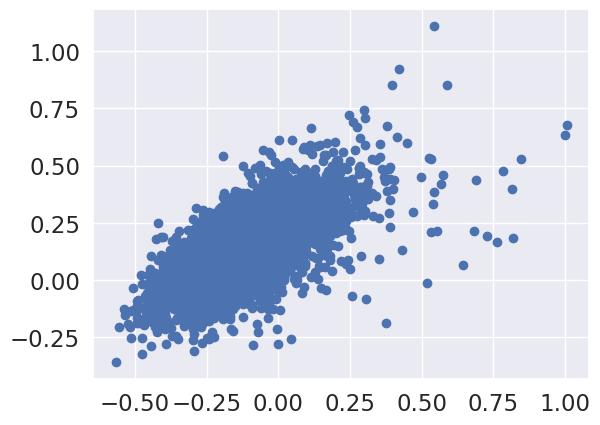

In [70]:
plt.scatter(model1.A_[:, 0], model1.A_[:, 1], cmap = 'hot')

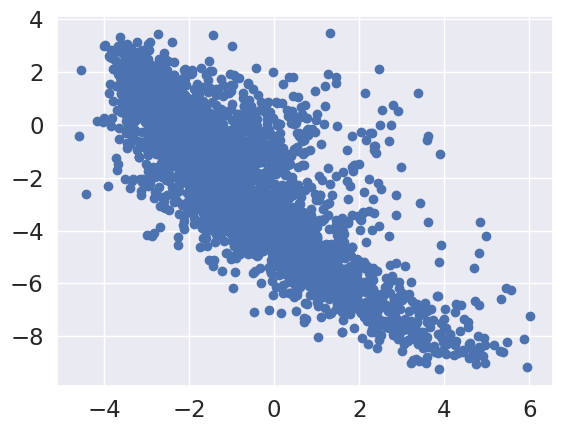

In [71]:
plt.scatter(model1.B_[:, 0], model1.B_[:, 1], cmap='hot')

### 5.4.2 Using Surprise Library<a id='surprise'></a>

In [72]:
from surprise import Reader, SVD, Dataset
from surprise.model_selection import cross_validate

In [73]:
data.Rating.value_counts()

,count
Rating,
4,347758
3,260473
5,224639
2,107261
1,56013


In [74]:
##The Reader class is used to parse a file containing ratings.It orders the data in format of (userid,title,rating) and even by
##considering the rating scale
user_itm = data[['UserID', 'Title', 'Rating']].copy()
reader = Reader(rating_scale=(1,5))
data1 = Dataset.load_from_df(user_itm[['UserID', 'Title', 'Rating']], reader)

In [75]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserID'].unique()))
print("No.of Items:",len(user_itm['Title'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3640


In [76]:
svd = SVD(n_factors=4)
cross_validate(svd, data1, measures=['rmse'], cv=3, return_train_measures=True)
##The dataset is divided into train and test and with 3 folds the rmse has been calculated

{'test_rmse': array([0.89218642, 0.89037035, 0.88951041]),
 'train_rmse': array([0.86280417, 0.86143625, 0.86048584]),
 'fit_time': (9.369915962219238, 10.91328740119934, 9.747197151184082),
 'test_time': (4.611389636993408, 3.3030149936676025, 3.9688572883605957)}

In [77]:
trainset = data1.build_full_trainset()
svd.fit(trainset) ##Fitting the trainset with the help of svd

In [78]:
svd.pu

array([[ 0.31096954, -0.0414775 ,  0.0594095 , -0.14657091],
       [ 0.3594236 , -0.27538149, -0.23155216,  0.08617026],
       [-0.33449153, -0.05642853, -0.09473366,  0.00368887],
       ...,
       [-0.29126092,  0.14094672,  0.06545413, -0.03006094],
       [ 0.00132793, -0.09006503, -0.27691897,  0.22701811],
       [ 0.07752775, -0.17400341, -0.05592384, -0.16945732]])

In [79]:
svd.pu.shape , svd.qi.shape #pu gives the embeddings of Users and qi gives the embeddings of Items.

((6040, 4), (3640, 4))

In [80]:
#Storing all the movie titles in items
items = movies['Title'].unique()
##Considering the user '662'
test = [[662, iid, 4] for iid in items]
##Finding the user predictions(ratings) for all the movies
predictions = svd.test(test)
pred = pd.DataFrame(predictions)

In [81]:
a = pred.sort_values(by='est', ascending=False) ##Sorting the values based on the estimated predictions

In [82]:
a[0:10] ##TOP 10

,uid,iid,r_ui,est,details
2806,662,Sanjuro,4,4.72,{'was_impossible': False}
315,662,"Shawshank Redemption, The",4,4.53,{'was_impossible': False}
1130,662,"Wrong Trousers, The",4,4.52,{'was_impossible': False}
49,662,"Usual Suspects, The",4,4.52,{'was_impossible': False}
3236,662,For All Mankind,4,4.51,{'was_impossible': False}
892,662,Rear Window,4,4.51,{'was_impossible': False}
735,662,"Close Shave, A",4,4.50,{'was_impossible': False}
1187,662,To Kill a Mockingbird,4,4.49,{'was_impossible': False}
900,662,Casablanca,4,4.48,{'was_impossible': False}
662,662,Pather Panchali,4,4.48,{'was_impossible': False}


In [83]:
testset = trainset.build_anti_testset()

predictions_svd = svd.test(testset)

In [84]:
from surprise import accuracy
print('SVD - RMSE:', accuracy.rmse(predictions_svd, verbose=False))
print('SVD - MAE:', accuracy.mae(predictions_svd, verbose=False))

SVD - RMSE: 0.7033573186261063
SVD - MAE: 0.5442049960503313


**Embeddings for user-user similarity using surprise library.**

In [85]:
user=cosine_similarity(svd.pu)

user_sim_matrix = pd.DataFrame(user, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()  #User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00  0.53 -0.87 -0.54  0.75  0.19 -0.44 -0.61 -0.06  0.54 -0.31   
10      0.53  1.00 -0.45 -0.29  0.81 -0.67  0.40  0.27  0.19  0.81 -0.46   
100    -0.87 -0.45  1.00  0.63 -0.86 -0.10  0.36  0.38 -0.04 -0.47 -0.09   
1000   -0.54 -0.29  0.63  1.00 -0.48  0.19  0.60  0.16  0.71 -0.75 -0.44   
1001    0.75  0.81 -0.86 -0.48  1.00 -0.35  0.10  0.03  0.25  0.67 -0.13   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.38 -0.08  0.74  0.89  0.96  0.14  0.26  0.55  0.71  0.64  0.55   
10      0.25  0.33  0.58  0.48  0.61  0.43 -0.34  0.90  0.25  0.97  0.93   
100    -0.09  0.41 -0.34 -0.56 -0.90  0.14 -0.30 -0.55 -0.64 -0.49 -0.29   
1000    0.56  0.70 -0.07 -0.25 -0.39  0.65  0.42 -0.66  0.14 -0.44 -0.21   
1001    0.17 -0.09  0.41  0.49  0.86  0.14  0.05  0.80  0.53  0.78  0.62   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.24 -0.86  0.07 -0.58  0.30  0.29 -0.75  0.70  0.55  0.09  0.35   
10     -0.75 -0.75  0.78 -0.91 -0.08  0.83  0.03  0.89  0.88  0.70  0.91   
100     0.03  0.57 -0.28  0.63 -0.71 -0.14  0.52 -0.43 -0.42  0.09 -0.46   
1000   -0.39  0.33 -0.10  0.61 -0.45  0.28  0.58 -0.21  0.09  0.47 -0.16   
1001   -0.43 -0.66  0.69 -0.88  0.48  0.56 -0.17  0.67  0.74  0.35  0.84   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1      -0.62  0.05 -0.32  0.29  0.32 -0.48  0.47 -0.23 -0.67  0.26 -0.35   
10     -0.98 -0.08  0.40  0.63  0.91 -0.37  0.68 -0.90 -0.01 -0.45 -0.43   
100     0.54 -0.03  0.09 -0.21 -0.43  0.02 -0.14  0.05  0.45  0.04  0.01   
1000    0.23 -0.79 -0.37  0.46 -0.17 -0.25  0.28 -0.07  0.71 -0.25 -0.51   
1001   -0.86 -0.13  0.21  0.53  0.82 -0.11  0.41 -0.52 -0.14 -0.42 -0.20   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1      -0.46 -0.00  0.35  0.31  0.61 -0.19  0.77 -0.72 -0.75  0.52 -0.84   
10      0.17 -0.79 -0.44  0.49  0.92 -0.75  0.20 -0.57 -0.16  0.97 -0.84   
100     0.05  0.05 -0.04  0.02 -0.39  0.10 -0.76  0.53  0.58 -0.44  0.71   
1000   -0.02  0.30  0.06  0.52 -0.43  0.55 -0.04  0.82 -0.09 -0.49  0.23   
1001    0.21 -0.48 -0.33  0.23  0.66 -0.42  0.58 -0.51 -0.40  0.76 -0.87   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1       0.03 -0.59 -0.89  0.05 -0.25 -0.18 -0.88 -0.33  0.67 -0.37 -0.47   
10      0.84  0.04 -0.61  0.47 -0.90 -0.89 -0.62  0.60 -0.23  0.14 -0.55   
100     0.02  0.79  0.98  0.09  0.30  0.04  0.80  0.41 -0.70  0.00  0.04   
1000   -0.16  0.81  0.67  0.69 -0.03 -0.12  0.83  0.25 -0.52  0.39 -0.23   
1001    0.44 -0.45 -0.92  0.25 -0.74 -0.51 -0.74  0.10  0.25  0.25 -0.23   

UserID  1058  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  \
UserID                                                                          
1      -0.19  0.30 0.09 -0.30 -0.27  0.19  0.28  0.53 -0.53  0.03 -0.43  0.05   
10      0.08  0.14 0.82 -0.67  0.17  0.46  0.58  0.65 -0.94  0.78 -0.82  0.63   
100     0.11 -0.36 0.10 -0.11  0.24 -0.05  0.07 -0.10  0.30  0.18  0.42  0.26   
1000   -0.67  0.50 0.24 -0.08  0.83  0.63  0.44 -0.11  0.10  0.25 -0.17  0.44   
1001   -0.07  0.39 0.39 -0.20  0.06  0.33  0.23  0.29 -0.66  0.31 -0.76  0.16   

UserID  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  \
UserID                                                                     
1       0.09 -0.35  0.07  0.59 -0.61 -0.02  0.74 -0.73  0.89 -0.33  0.38   
10    

**Embeddings for item-item similarity using surprise library.**

In [86]:
itm=cosine_similarity(svd.qi)

itm_sim_matrix = pd.DataFrame(itm) #, columns=user_itm['Title'].unique())
itm_sim_matrix.head()#Item similarity matrix using the embeddings from matrix factorization

0     1     2     3     4     5     6     7     8     9     10    11    \
0  1.00  0.21  0.13  0.48  0.24 -0.25  0.31  0.09 -0.42 -0.39  0.49 -0.45   
1  0.21  1.00  0.87  0.77  0.95 -0.91  0.77  0.81  0.72  0.27  0.73  0.62   
2  0.13  0.87  1.00  0.45  0.98 -0.68  0.48  0.86  0.82  0.65  0.74  0.48   
3  0.48  0.77  0.45  1.00  0.61 -0.70  0.63  0.29  0.15 -0.20  0.75  0.53   
4  0.24  0.95  0.98  0.61  1.00 -0.78  0.60  0.85  0.75  0.50  0.80  0.51   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0  0.59  0.31 -0.20 -0.51  0.85 -0.99 -0.48 -0.15  0.29  0.19 -0.48 -0.03   
1  0.90 -0.42  0.91 -0.84  0.20 -0.18 -0.02  0.83 -0.59  0.82  0.63  0.93   
2  0.79 -0.78  0.76 -0.52 -0.12 -0.04  0.39  0.95 -0.81  0.98  0.81  0.69   
3  0.75  0.15  0.59 -0.93  0.64 -0.54 -0.37  0.40  0.06  0.44  0.08  0.76   
4  0.88 -0.64  0.80 -0.68  0.06 -0.17  0.22  0.91 -0.71  0.96  0.72  0.79   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0  0.05  0.52 -0.20  0.72 -0.43 -0.46  0.03 -0.45 -0.20  0.90  0.16  0.54   
1 -0.95  0.24  0.84 -0.32 -0.73 -0.96  0.86 -0.75  0.45 -0.05 -0.23 -0.39   
2 -0.89  0.09  0.86 -0.54 -0.92 -0.82  0.99 -0.82  0.38 -0.21 -0.57 -0.68   
3 -0.67  0.13  0.54  0.12 -0.36 -0.85  0.40 -0.35 -0.02  0.27  0.42  0.26   
4 -0.92  0.17  0.86 -0.42 -0.90 -0.92  0.96 -0.83  0.38 -0.09 -0.43 -0.53   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0  0.66 -0.18  0.48 -0.54  0.01 -0.79  0.17 -0.79 -0.18 -0.05 -0.12  0.34   
1  0.70  0.87  0.06 -0.81 -0.50 -0.54  0.48  0.26 -0.53  0.76 -0.67  0.96   
2  0.65  0.64 -0.34 -0.65 -0.85 -0.54 -0.00  0.45 -0.87  0.90 -0.28  0.87   
3  0.81  0.65  0.68 -0.93 -0.00 -0.70  0.80 -0.15 -0.05  0.18 -0.64  0.83   
4  0.74  0.71 -0.15 -0.76 -0.74 -0.63  0.18  0.33 -0.77  0.85 -0.42  0.95   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0 -0.26 -0.10  0.03 -0.81  0.53  0.32 -0.54  0.08  0.16  0.95  0.59 -0.34   
1  0.00 -0.95 -0.86 -0.38  0.90  0.19  0.60 -0.52 -0.07  0.08  0.62  0.55   
2  0.05 -0.70 -0.68 -0.48  0.77 -0.24  0.52 -0.42 -0.54 -0.10  0.26  0.80   
3 -0.45 -0.79 -0.51 -0.23  0.89  0.42  0.43 -0.67  0.42  0.53  0.74 -0.11   
4 -0.01 -0.80 -0.74 -0.51  0.88 -0.08  0.52 -0.48 -0.37  0.04  0.43  0.69   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0  0.43 -0.34 -0.71 -0.79  0.58 -0.59 -0.89 -0.74 -0.55 -0.00  0.35 -0.13   
1  0.83  0.70  0.50  0.20  0.65  0.66 -0.59 -0.40  0.49 -0.86  0.90  0.87   
2  0.95  0.65  0.54  0.32  0.39  0.58 -0.39 -0.12  0.72 -0.85  0.95  0.95   
3  0.54  0.20  0.13 -0.06  0.96  0.29 -0.77 -0.53 -0.13 -0.37  0.67  0.37   
4  0.96  0.63  0.48  0.23  0.55  0.57 -0.54 -0.27  0.60 -0.86  0.98  0.92   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0  0.81 -0.88  0.02  0.17 -0.24 -0.45 -0.72  0.12 -0.85  0.47 -0.78  0.20   
1  0.51 -0.51 -0.11 -0.58  0.87 -0.35 -0.83 -0.45 -0.33  0.95 -0.31  0.91   
2  0.61 -0.24 -0.45 -0.88  0.81 -0.68 -0.71 -0.69 -0.36  0.79 -0.39  0.84   
3  0.37 -0.81 -0.01 -0.09  0.59  0.03 -0.79 -0.25 -0.56  0.89 -0.15  0.52   
4  0.65 -0.41 -0.35 -0.78  0.83 -0.61 -0.82 -0.62 -0.43  0.90 -0.42  0.88   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0  0.10 -0.66 -0.63 -0.71 -0.71 -0.07  0.38 -0.30  0.72  0.19  0.16  0.21   
1  0.90  0.39  0.60 -0.82 -0.54  0.83 -0.33  0.78  0.61 -0.52  0.89 -0.45   
2  0.79  0.58  0.51 -0.69 -0.59  0.79 -0.67  0.86  0.30 -0.83  0.87 -0.76   
3  0.52 -0.01  0.21 -0.74 -0.65  0.68  0.09  0.40  0.95 -0.08  0.44 -0.06   
4  0.84  0.48  0.49 -0.79 -0.65  0.82 -0.53  0.83  0.47 -0.73  0.89 -0.65   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0 -0.92 -0.58 -0.78 -0.46 -0.63  0.57  0.22  0.84 -0.91  0.19 -0.02 -0.81   
1 -0.00 -0.83  0.19  0.64 -0.24  0.42 -0.19  0.40  0.09 -0.04 -0.92  0.05   
2  0.20 -0.78 -0.03  0.77  0.16  0.46 -0.63  0.45  0.20  0.40 -0.92 

In [87]:
movie_id=586
movie_rating = itm_sim_matrix[movie_id] # Taking the ratings of that movie
print(movie_rating)

0      -0.25
1       0.77
2       0.86
3       0.20
4       0.81
        ... 
3635    0.37
3636   -0.96
3637   -0.74
3638   -0.71
3639   -0.45
Name: 586, Length: 3640, dtype: float64


In [88]:
similar_movies = itm_sim_matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[: , :].head() #Top 5 correlated movies.

,Correlation
586,1.00
918,1.00
3167,1.00
1310,0.99
1675,0.99


In [89]:
item_mov = data[['MovieID', 'Title']].copy()
item_mov.drop_duplicates(inplace=True)
item_mov.reset_index(drop=True,inplace=True)
item_mov.MovieID=item_mov.MovieID.astype('str')

sim_df1= sim_df.copy()
sim_df1.reset_index(inplace=True)
sim_df1.rename(columns = {'index':'MovieID'}, inplace = True)
sim_df1.MovieID=sim_df1.MovieID.astype('str')
sim_mov = pd.merge(sim_df1,item_mov,on='MovieID',how='inner')
#sim_df1.head()
sim_mov.head()

,MovieID,Correlation,Title
0,586,1.00,Home Alone
1,918,1.00,Meet Me in St. Louis
2,3167,1.00,Carnal Knowledge
3,1310,0.99,Hype!
4,1675,0.99,Incognito


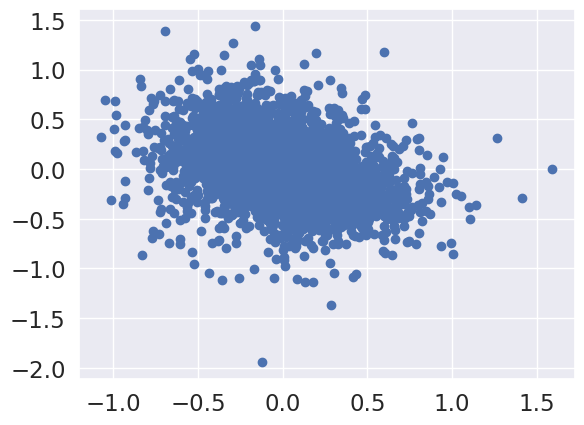

In [90]:
plt.scatter(svd.pu[:, 0], svd.pu[:, 1], cmap = 'hot')

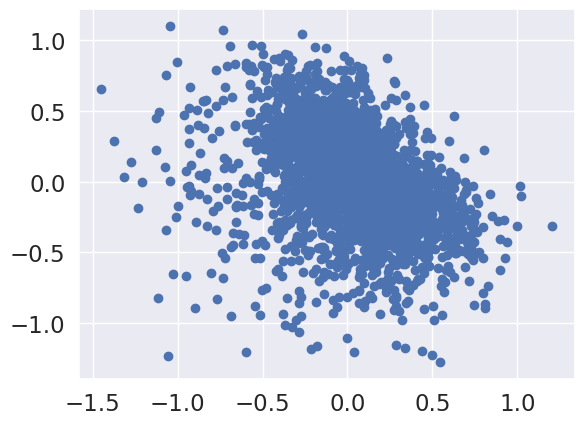

In [91]:
plt.scatter(svd.qi[:, 0], svd.qi[:, 1], cmap = 'hot')

## 5.5 User-Based Approach(optional)<a id='user_based'></a>

In [92]:
#Taking 6 movies names in random
mov_name = ['Hamlet', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone','Robin Hood','It Happened One Night']

In [93]:
#Finding the MovieID's for the above movies
mov_id = []
for mov in mov_name:
    id = data[data['Title'] == mov]['MovieID'].iloc[0]
    mov_id.append(id)

In [94]:
#mov_rating = list(map(int, input("Rate these movies respectively: ").split()))
mov_rating = [5,3,2,1,4,3]#Give the random user rating for the movies

In [95]:
user_choices = pd.DataFrame({'MovieID': mov_id, 'Title': mov_name, 'Rating': mov_rating})
user_choices.sort_values(by='MovieID') #User choices

,MovieID,Title,Rating
0,1411,Hamlet,5
1,231,Dumb & Dumber,3
4,3034,Robin Hood,4
2,344,Ace Ventura: Pet Detective,2
3,586,Home Alone,1
5,905,It Happened One Night,3


In [96]:
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)] #Finding the similar users who watched same movies
other_users = other_users[['UserID', 'MovieID', 'Rating']]
other_users['UserID'].nunique()

1810

In [97]:
common_movies = other_users.groupby(['UserID']) #Grouping the data based on User who watched the common movies
common_movies = sorted(common_movies, key=lambda x: len(x[1]), reverse=True) #Soring the data so that who watched more number of common movies comes at the top.
common_movies[0]

(('1605',),
        UserID MovieID  Rating
 60682    1605     231       2
 92082    1605     344       3
 156207   1605     586       3
 214130   1605     905       4
 416462   1605    1411       3
 811059   1605    3034       4)

In [98]:
top_users = common_movies[:100] #Taking top 100 users who watched same movies as in user choices.

In [99]:
#Calculating pearson correlation
pearson_corr = {}

for user_id, movies in top_users:
    movies = movies.sort_values(by='MovieID')
    movie_list = movies['MovieID'].values #Taking list of movieid's

    new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values # Taking the new user rating values based on user choices
    user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values #Taking the actual rating values of the movies

    corr = pearsonr(new_user_ratings, user_ratings) # Calculating the correlation
    pearson_corr[user_id] = corr[0] #Correlation value for each UserID

In [100]:
pearson_df = pd.DataFrame(
    columns=['UserID', 'Similarity Index'],
    data=[(int(user_id[0]), corr) for user_id, corr in pearson_corr.items()]
)
pearson_df = pearson_df.sort_values(by='Similarity Index', ascending=False)[:10]
pearson_df['UserID'] = pearson_df['UserID'].astype('str')
pearson_df

,UserID,Similarity Index
99,3756,0.97
67,2109,0.97
87,3224,0.94
66,2106,0.87
40,1019,0.87
13,2288,0.87
27,48,0.87
70,2507,0.85
22,4016,0.80
31,5530,0.76


In [101]:
users_rating = pearson_df.merge(data, on='UserID', how='inner') #Merging the original data with pearson correlation values
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index'] # Calculating the Weighed rating for each user and movie
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]
users_rating

,UserID,MovieID,Rating,Similarity Index,Weighted Rating
0,3756,1,5,0.97,4.84
1,3756,2,3,0.97,2.90
2,3756,11,4,0.97,3.87
3,3756,13,4,0.97,3.87
4,3756,24,3,0.97,2.90
...,...,...,...,...,...
7395,5530,3705,3,0.76,2.27
7396,5530,3712,2,0.76,1.51
7397,5530,3713,4,0.76,3.02
7398,5530,3723,3,0.76,2.27


In [102]:
# Calculate sum of similarity index and weighted rating for each movie
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

recommend_movies = pd.DataFrame()

# Add average recommendation score.
# We're calculating average recommendation score by dividing the Weighted Rating by the Similarity Index.
recommend_movies['avg_reccomend_score'] = grouped_ratings['Weighted Rating']/grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

# Select movies with the highest score i.e. 5
recommend_movies = recommend_movies[(recommend_movies['avg_reccomend_score'] == 5)]

In [103]:
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']].sample(10)
recommendations

,MovieID,Title
375128,1296,"Room with a View, A"
770421,2874,"Pajama Game, The"
824716,3091,Kagemusha
895898,3429,Creature Comforts
291932,1192,Paris Is Burning
942942,3653,"Endless Summer, The"
619564,2303,Nashville
257587,1066,Shall We Dance?
876520,3330,Splendor in the Grass
663855,2442,Hilary and Jackie


## 5.6 Regression Based Rec Sys<a id='reg'></a>

In [104]:
from sklearn.preprocessing import StandardScaler

In [105]:
movies1.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [106]:
ratings1.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [107]:
users1.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


In [108]:
m = pd.concat([movies1['MovieID'],genres_df.iloc[:,1:]],axis=1)
m.head()

,MovieID,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,2,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,3,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
3,4,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,5,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [109]:
from datetime import datetime
r = ratings1.copy()
r['Timestamp']=r['Timestamp'].astype('int32')
r['Rating']=r['Rating'].astype('int32')
r['hour'] = r['Timestamp'].apply(lambda x: datetime.fromtimestamp(x).hour)
r.head()

,UserID,MovieID,Rating,Timestamp,hour
0,1,1193,5,978300760,22
1,1,661,3,978302109,22
2,1,914,3,978301968,22
3,1,3408,4,978300275,22
4,1,2355,5,978824291,23


In [110]:
users2 = users1.merge(r.groupby('UserID').Rating.mean().reset_index(), on='UserID')
users2 = users2.merge(r.groupby('UserID').hour.mean().reset_index(), on='UserID')
users2.head(2)

,UserID,Gender,Age,Occupation,Zip-code,Rating,hour
0,1,F,1,10,48067,4.19,22.25
1,2,M,56,16,70072,3.71,21.16


In [111]:
u = users2[['UserID','Age', 'Rating', 'hour']].copy()
u = u.set_index('UserID')
u .columns = ['Age', 'User_avg_rating', 'hour']

scaler = StandardScaler()
u = pd.DataFrame(scaler.fit_transform(u), columns=u.columns, index=u.index)
u.head(2)

,Age,User_avg_rating,hour
UserID,,,
1,-2.30,1.13,1.41
2,1.97,0.02,1.26


In [112]:
df_cat = users2[['Gender','Occupation']]
df_cat['Gender']=pd.get_dummies(df_cat['Gender'], columns=['Gender'],drop_first=True)
df_cat = pd.concat([users['UserID'],df_cat],axis=1)
df_cat.head()

,UserID,Gender,Occupation
0,1,False,10
1,2,True,16
2,3,True,15
3,4,True,7
4,5,True,20


In [113]:
X = ratings[['MovieID', 'UserID', 'Rating']].copy()
X = X.merge(u.reset_index(), on='UserID', how='right')
X = X.merge(m.reset_index(), on='MovieID', how='right')
X = X.merge(df_cat, on='UserID', how='right')
X.drop(columns=['index'], axis=1, inplace=True)
X.dropna(inplace=True)
X.reset_index(inplace=True,drop=True)
X1=X.copy()
X.head()

,MovieID,UserID,Rating,Age,User_avg_rating,hour,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Gender,Occupation
0,1,1,5,-2.30,1.13,1.41,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,10
1,48,1,5,-2.30,1.13,1.41,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,False,10
2,150,1,5,-2.30,1.13,1.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,10
3,260,1,4,-2.30,1.13,1.41,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,10
4,527,1,5,-2.30,1.13,1.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,False,10


In [114]:
X = X.drop(columns = ['MovieID', 'UserID'])
y = X.pop('Rating')

In [115]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=SEED)

In [116]:
from sklearn.ensemble import GradientBoostingRegressor

model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [117]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred)) # calculating rmse value
print('Root Mean Squared Error: {:.3f}'.format(rmse))

Root Mean Squared Error: 1.007


In [118]:
mape =  mean_absolute_percentage_error(y_test, y_pred) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Mean Absolute Percentage Error: 0.323


## 5.7 Ensemble Recommender System<a id='ene'></a>

In [119]:
X1.head()

,MovieID,UserID,Rating,Age,User_avg_rating,hour,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Gender,Occupation
0,1,1,5,-2.30,1.13,1.41,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,10
1,48,1,5,-2.30,1.13,1.41,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,False,10
2,150,1,5,-2.30,1.13,1.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,10
3,260,1,4,-2.30,1.13,1.41,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,10
4,527,1,5,-2.30,1.13,1.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,False,10


In [120]:
y = X1.pop('Rating')

In [121]:
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.2, random_state=SEED)

In [122]:
X_train1 = X_train[['MovieID', 'UserID']].copy()
X_train = X_train.drop(columns = ['MovieID', 'UserID'])
user_item_train=pd.concat([X_train1,y_train],axis=1)

In [123]:
X_test1 = X_test[['MovieID', 'UserID']].copy()
X_test = X_test.drop(columns = ['MovieID', 'UserID'])
user_item_test=pd.concat([X_test1,y_test],axis=1)

In [124]:
model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred_reg = model.predict(X_test)

In [125]:
user_item_test.columns = ['UserId', 'ItemId', 'Rating']  # Lib requires specific column names
user_item_test.head(2)

,UserId,ItemId,Rating
832435,239,5026,1
514289,1597,3189,4


In [126]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False,produce_dicts=True)
model.fit(user_item_test)

Collective matrix factorization model
(explicit-feedback variant)


In [127]:
y_pred_mf = np.dot(model.A_, model.B_.T) + model.glob_mean_

In [128]:
df = pd.DataFrame(y_pred_mf,columns =list(model.item_mapping_),index=list(model.user_mapping_))
df.head()

5026  3189  1053  2206  5306  1284  4964  1101  2271  2866  4655  2664  \
239   1.21  2.55  2.54  2.40  2.40  3.35  3.32  2.85  3.72  1.37  2.85  3.08   
1597  3.27  3.64  2.85  2.84  3.54  2.96  2.49  2.41  3.89  2.58  2.76  3.56   
2013  3.06  3.58  3.35  3.46  3.60  3.19  2.94  2.54  4.29  3.02  3.07  3.90   
1280  4.19  4.39  3.98  4.81  4.34  3.92  3.46  3.60  4.54  4.39  3.85  4.29   
3045  2.26  3.20  2.41  2.71  2.84  3.72  3.30  3.69  3.34  1.88  3.16  2.89   

      4446  3989  2814  3985  520  395  5716  2022  319  3884  2853  4979  \
239   3.22  3.72  3.01  2.95 3.34 2.91  3.07  2.75 2.56  1.26  1.48  2.77   
1597  3.13  3.76  4.87  3.00 3.29 2.62  3.37  4.11 3.03  1.87  3.04  2.48   
2013  3.62  4.23  4.39  3.44 3.40 2.12  3.39  3.69 3.23  1.74  3.23  2.72   
1280  4.28  4.61  4.93  4.10 4.38 2.83  4.17  4.27 4.05  2.97  3.69  3.93   
3045  3.14  3.38  3.84  2.93 4.02 4.30  3.70  3.64 2.96  2.54  1.49  3.55   

      3303  3389  2995  549  4883  5397  735  4508  4956  4886  5148  3418  \
239   4.02  2.24  3.35 3.64  3.30  2.26 3.21  2.43  3.39  3.78  2.17  2.88   
1597  3.33  2.48  4.10 3.47  3.43  2.56 3.28  2.63  3.10  4.03  2.70  2.26   
2013  3.64  2.77  4.09 3.94  2.78  2.53 3.58  2.78  3.50  4.49  2.96  2.34   
1280  4.17  3.76  4.59 4.52  2.38  3.59 4.05  3.92  4.30  4.40  4.34  3.58   
3045  4.13  2.74  3.67 3.52  3.85  3.24 3.21  3.23  3.59  3.00  2.99  3.97   

      2309  4520  198  4440  2926  877  1635  338  1059  4819  3677  5763  \
239   2.80  3.84 3.98  3.22  2.53 2.93  3.26 3.38  2.46  3.19  5.05  2.42   
1597  3.00  3.54 3.65  3.12  3.40 3.12  3.72 3.35  1.56  4.31  3.53  2.54   
2013  3.55  3.99 3.97  3.67  3.53 3.35  3.64 3.91  2.31  4.42  4.05  3.14   
1280  4.00  4.29 4.29  4.18  4.38 4.12  4.56 4.36  3.02  4.53  3.87  4.07   
3045  2.44  3.52 3.83  2.94  3.00 3.28  4.09 3.00  2.26  2.98  4.34  2.45   

      426  4049  5403  2376  702  3192  5572  5185  3302  3403  5964  770  \
239  4.68  3.06  3.71  3.00 2.13  4.73  4.71  2.88  1.32  3.91  3.61 2.48   
1597 3.59  3.35  3.89  2.41 2.95  4.13  4.23  3.26  3.74  3.88  3.28 3.00   
2013 4.48  3.67  3.62  2.85 2.96  4.15  4.51  3.40  3.40  4.22  3.52 3.57   
1280 3.92  4.26  3.15  3.55 3.81  4.13  4.47  3.86  3.83  4.36  4.14 4.23   
3045 3.09  3.09  3.64  3.13 2.81  4.70  4.29  3.06  1.88  3.54  3.86 2.24   

      2506  3313  3792  3023  4343  3301  5433  245  3823  250  2746  1057  \
239   3.42  3.17  3.65  2.20  2.29  2.91  2.59 1.86  3.83 3.73  2.03  3.93   
1597  3.79  3.60  3.85  3.87  3.50  3.17  2.85 2.25  4.03 3.90  4.38  3.11   
2013  3.94  3.70  3.91  3.95  3.39  3.22  3.10 2.39  4.16 3.39  3.74  3.67   
1280  4.37  4.12  4.29  4.53  4.60  4.18  3.74 3.35  4.02 3.34  4.65  4.13   
3045  3.52  3.34  3.84  2.40  3.34  3.66  2.82 2.53  3.47 4.36  3.39  3.66   

      4032  5394  4489  4566  5090  1912  5166  3331  4151  5151   59  2566  \
239   2.93  2.88  4.09  3.85  4.42  0.88  3.85  3.50  3.81  4.15 2.62  2.33   
1597  3.59  3.09  3.57  3.71  3.17  1.78  3.58  3.09  3.81  3.34 2.51  3.32   
2013  3.15  3.18  3.95  3.70  3.90  1.92  3.94  4.15  4.46  4.34 2.79  2.94   
1280  4.26  3.76  4.47  4.27  4.03  2.91  4.42  4.53  4.21  4.06 3.67  3.86   
3045  4.41  3.27  4.07  4.35  3.67  1.57  3.78  2.43  2.69  2.64 3.05  3.55   

      5925  4085  3233  1963  4524  731  4387  2338  1266  3848  4725  2147  \
239   3.33  3.55  3.63  3.06  3.43 4.01  2.47  3.88  2.51  3.08  3.02  4.07   
1597  3.31  3.70  3.12  3.64  2.88 3.78  2.98  3.77  3.20  3.58  3.31  2.76   
2013  3.40  3.85  3.23  3.52  3.88 4.07  3.11  3.74  3.44  3.59  3.33  3.51   
1280  3.97  4.14  3.77  4.66  3.82 4.48  3.69  4.09  4.36  4.40  3.69  3.74   
3045  3.72  3.56  4.01  4.13  2.11 3.97  2.79  4.22  2.92  3.70  3.27  3.43   

      5776  1643  3128  4531  5987  4904  5323  3484  3465  132  2953  3847  \
239   3.70  3.71  2.78  0.95  0.83  4.43  2.55  1.08  1.78 3.65  0.16  2.00   
1597  3.40  3.85  2.72  2.20  2.53  4.58  2.61  3.02  3.72 3.96  2.81  2.70   
2013  3.63 

In [129]:
del svd
del model
del predictions_svd
del testset
import gc
gc.collect()

96

In [130]:
df1=df.unstack().reset_index()
df1.rename(columns={'level_0': 'ItemId', 'level_1': 'UserId',0:'Rating'}, inplace=True)
df1.tail()

,ItemId,UserId,Rating
20825057,1669,3776,3.53
20825058,1669,3353,3.56
20825059,1669,67,3.51
20825060,1669,655,3.90
20825061,1669,3166,4.03


In [131]:
df_mf = pd.merge(user_item_test, df1, on=['UserId','ItemId'], how='inner')
df_mf.rename(columns={'Rating_x': 'True_rating', 'Rating_y': 'Mf_pred_ratings'}, inplace=True)
df_mf.head()

,UserId,ItemId,True_rating,Mf_pred_ratings
0,239,5026,1,1.21
1,1597,3189,4,3.64
2,2013,1053,3,3.35
3,1280,2206,5,4.81
4,3045,5306,4,2.84


In [132]:
df_gb=pd.DataFrame(y_pred_reg,columns =['reg_pred_ratings'])
df_reg= pd.concat([df_gb,df_mf['Mf_pred_ratings']],axis=1)
df_reg.head()

,reg_pred_ratings,Mf_pred_ratings
0,2.91,1.21
1,3.00,3.64
2,3.29,3.35
3,3.87,4.81
4,3.46,2.84


In [133]:
y = df_mf['True_rating']
X_train, X_test, y_train, y_test = train_test_split(df_reg, y, test_size=0.2, random_state=SEED)

In [134]:
from sklearn.linear_model import LinearRegression

In [135]:
model = LinearRegression().fit(X_train, y_train)

In [136]:
y_pred_en=model.predict(X_test)

In [138]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred_en)) # calculating rmse value
print('Root Mean Squared Error: {:.3f}'.format(rmse))

Root Mean Squared Error: 0.757


In [139]:
mape =  mean_absolute_percentage_error(y_test, y_pred_en) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Mean Absolute Percentage Error: 0.218


# 6. Questionnaire <a id='Quest'></a>

1. Users of which age group have watched and rated the most number of movies? :- **25-34 age group**

2. Users belonging to which profession have watched and rated the most movies? :- **college/grad student**

3. Most of the users in our dataset who’ve rated the movies are Male. (T/F):- **True**

4. Most of the movies present on our dataset were released in which decade? :- **b.90s**
    a.70s		b. 90s		c. 50s		d.80s

5. The movie with maximum no. of ratings is ___ :- **American Beauty**

6. Name the top 3 movies similar to ‘Liar Liar’ on the item-based approach. :- **Mrs. Doubtfire, Ace Ventura: Pet, Detective Dumb & Dumber**

7. On the basis of approach, Collaborative Filtering methods can be classified into **Memory-based** and **Model-based**.

8. Pearson Correlation ranges between **-1 to 1** whereas, Cosine Similarity belongs to the interval between **-1 to 1**

9. Mention the RMSE and MAPE that you got while evaluating the Matrix Factorization model.:- **RMSE:0.701  and MAPE: 0.54**

10. Give the sparse ‘row’ matrix representation for the following dense matrix - [[1	0],[ 3	7]]

In [140]:
from scipy.sparse import csr_matrix
# create dense matrix
A = np.array([[1,0],[3,7]])
# convert to sparse matrix (CSR method)
S = csr_matrix(A)
print(S)

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 3 stored elements and shape (2, 2)>
  Coords	Values
  (0, 0)	1
  (1, 0)	3
  (1, 1)	7


In [152]:
#!sudo apt-get update
#!sudo apt-get install -y pandoc
#!sudo apt-get install -y texlive-xetex texlive-fonts-recommended texlive-plain-generic
#!pip install --upgrade nbconvert
#!pip install nbconvert[webpdf]
#!playwright install chromium
#!jupyter nbconvert --to webpdf Zee_Recommender_System.ipynb